In [1]:
import pandas as pd
import geopandas
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
GRParcels=geopandas.read_file('/Users/koonleong/Documents/UMMADS/SIADS591/project_git/go_blue/src/alan/All Municipalities Geometry and Municipality.geojson/All Municipalities Geometry and Municipality.shp')
GRParcels=GRParcels.to_crs('EPSG:4326')
GRParcels=GRParcels.__geo_interface__


In [3]:
Property_Level=pd.read_csv('/Users/koonleong/Documents/UMMADS/SIADS591/project_git/go_blue/src/alan/property_level.csv')


In [ ]:
fig=px.choropleth_mapbox(Property_Level,geojson=GRParcels,color='MSHDA Score',\
                        locations='ID',featureidkey='properties.ID',\
                        center={'lat':42.9634,'lon':-85.6681},
                        mapbox_style="carto-positron", zoom=10,
                        hover_data=['Address','City','Acres','SEV'])
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

In [ ]:
GRParcels=geopandas.read_file('documents/UofM/SIADS 591/Block_Group_Summary.shp')
GRParcels=GRParcels.to_crs('EPSG:4326')
GRParcels=GRParcels.__geo_interface__
Property_Level=pd.read_csv('documents/UofM/SIADS 591/Block_Group_Summary.csv')

In [ ]:
fig=px.choropleth_mapbox(Property_Level,geojson=GRParcels,color='MSHDA Score',\
                        locations='block_group',featureidkey='properties.GEOID',\
                        center={'lat':42.9634,'lon':-85.6681},
                        mapbox_style="carto-positron", zoom=10,
                        hover_)
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.show()

In [10]:
plot_df = Property_Level.loc[:,['City', 'MSHDA Score']]
plot_df['City'] = plot_df['City'].str.upper()


In [15]:
heatmap = px.density_heatmap(plot_df, x="MSHDA Score", y="City",
                             facet_row_spacing = 0.3,
                             facet_col_spacing = 0.3,
                             color_continuous_scale="RdYlGn",
                             width=1000, height=1000
                            )
heatmap.show()

In [22]:
splom_df = Property_Level.loc[:,["MSHDA Score", "Acres", "SEV"]]

sev_limit = splom_df.SEV<5000000
splom_df = splom_df[sev_limit]
splom_df["Per Acre"] = splom_df["SEV"]/splom_df["Acres"]

per_acre_limit = splom_df["Per Acre"] < 500000
splom_df = splom_df[per_acre_limit]

acre_limit = splom_df.Acres < 50
splom_df = splom_df[acre_limit]

SEV_limit = splom_df.SEV < 5000000
splom_df = splom_df[SEV_limit]

MSHDA_limit = splom_df['MSHDA Score'] > 0
splom_df = splom_df[MSHDA_limit]

splom_df['Rating']=""

lower_limit = 1
splom_df.loc[splom_df.Acres < lower_limit, ['Rating']]="Small"

upper_limit = 10
splom_df.loc[splom_df.Acres > upper_limit, ['Rating']]="Large"

ideal = (splom_df.Acres >= lower_limit) & (splom_df.Acres <= upper_limit)
splom_df.loc[ideal, ['Rating']]="Ideal"


,MSHDA Score,Acres,SEV,Per Acre,Rating
0,3.0,9.800932,147000.0,14998.573426,Ideal
1,2.0,5.232204,185600.0,35472.625379,Ideal
2,7.0,0.174842,25000.0,142986.217746,Small
3,2.0,3.046602,102200.0,33545.566630,Ideal
4,3.0,6.918759,405200.0,58565.420209,Ideal
...,...,...,...,...,...
227205,3.0,3.386798,135200.0,39919.713488,Ideal
227206,5.0,3.517213,131900.0,37501.278778,Ideal
227207,5.0,17.219753,193700.0,11248.709794,Large
227208,3.0,4.776085,95000.0,19890.770181,Ideal


<Figure size 207360x207360 with 0 Axes>

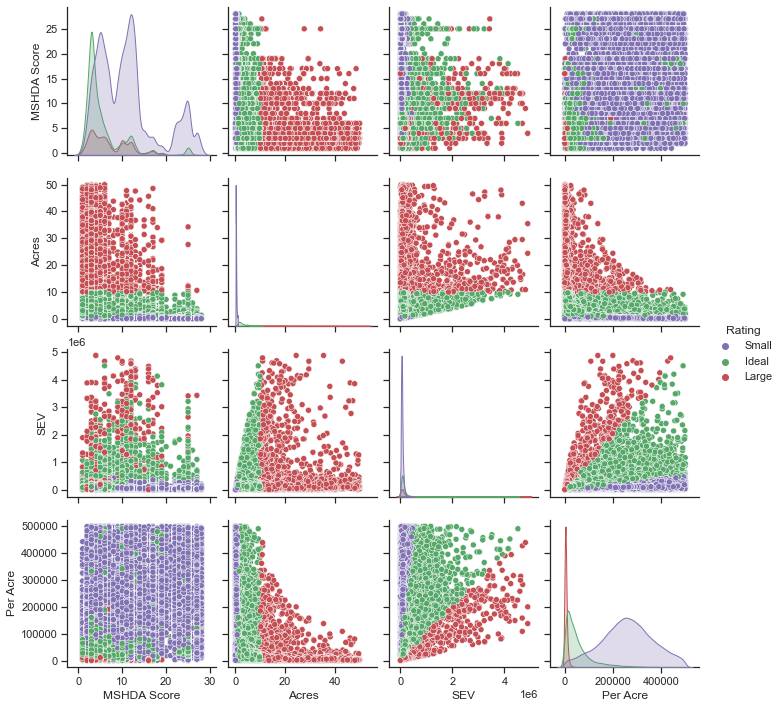

In [30]:
plt.figure(figsize=(2880, 2880))
sns.set_theme(style="ticks")
sns.pairplot(splom_df,
             hue_order = ['Small', 'Ideal', 'Large'],
             palette = {'Small': 'm', 'Ideal': 'g', 'Large': 'r'},
             hue = 'Rating',
             diag_kind = 'kde'
            )
